# Mask R-CNN Semantic segmentation - Boomerang Watch (BW) Trained Model

1. Validate, 
2. Test and 
3. Evaluate the trained Mask R-CNN model for Semantic Segmentation of Boomerang and Watch classes

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import json
import datetime
import skimage.draw


#Root directory of the project
ROOT_DIR = os.path.abspath("../")

#change to the trained model directory
MODEL_DIR = 'ajay-bw\bw20200530T1334'

print("Model directory", MODEL_DIR)

# find local version of the MR-CNNlibrary
sys.path.append(ROOT_DIR)  
# Import / Discover Mask RCNN model

from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
# import mrcnn.model as modellib
# new imports...
from mrcnn.config import Config
from mrcnn import model as modellib, utils

from mrcnn.model import log

from samples import MRCNN_Boomerang_Watch_Semantic_Trainer


%matplotlib inline 

Model directory ajay-bww20200530T1334


Using TensorFlow backend.


## Configurations

In [2]:
config = MRCNN_Boomerang_Watch_Semantic_Trainer.BW_Config()

In [3]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.8
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                16
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Notebook Preferences

In [4]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [5]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

# Extraction Classes. Inherited from MR_CNN libraries 

In [6]:
############################################################
#  Dataset
############################################################

class BW_Dataset(utils.Dataset):

    def load_BW(self, dataset_dir):
        """Load a subset of the boomerang watch dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        print("class loaded******************")
        # Add classes. We have only three class to add.
    
    # watch boomerang codes
        self.add_class("BW", 1, "watch")
        self.add_class("BW", 2, "boomerang")
        self.add_class("BW", 3, "guitar") # this classs is for future. We have not provided guitar annotated data set.
        
        # We mostly care about the x and y coordinates of each region
        annotations = json.load(open(os.path.join(dataset_dir, "via_region_data.json")))
        annotations = list(annotations.values())  # don't need the dict keys

        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]
        print ("annotations ", annotations)

        # Add images
        
        for a in annotations:
            # Get the x, y coordinaets of points of the polygons that make up
            # the outline of each object instance. There are stores in the
            # shape_attributes (see json format above)
            
            print ("\n\n *********************************this is a", a)
      
    ## for the VGG version NEW
            polygons = [r['shape_attributes'] for r in a['regions']]
            objects = [s['region_attributes'] for s in a['regions']]
    ## for the VGG version OLD         
#             polygons = [r['shape_attributes'] for r in a['regions'].values()]
#             objects = [s['region_attributes'] for s in a['regions'].values()]
            

            # load_mask() needs the image size to convert polygons to masks.
            # Unfortunately, VIA doesn't include it in JSON, so we must read
            num_ids = [int(n['class']) for n in objects]
            # the image. This is only managable since the dataset is tiny.
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]

            self.add_image(
                "BW",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, height=height,
                polygons=polygons,num_ids=num_ids)

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a BW dataset image, delegate to parent class.
        #image_info = self.image_info[image_id]
        info = self.image_info[image_id]
        if info["source"] != "BW":
            return super(self.__class__, self).load_mask(image_id)
        num_ids = info['num_ids']
        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        #info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)

        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        num_ids = np.array(num_ids, dtype=np.int32)
        return mask, num_ids

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "BW":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


## Load Validation Dataset

In [7]:
# Load validation dataset
dataset = BW_Dataset()
dataset.load_BW("./val/")


# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

class loaded******************
annotations  [{'filename': 'c12.jpg', 'size': 6016, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [28, 56, 91, 109, 96, 68, 29], 'all_points_y': [66, 45, 49, 76, 111, 122, 100]}, 'region_attributes': {'class': '1\n'}}], 'file_attributes': {}}, {'filename': 'c13.jpg', 'size': 5083, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [23, 60, 89, 100, 83, 49, 23], 'all_points_y': [60, 38, 51, 82, 110, 112, 92]}, 'region_attributes': {'class': '1\n'}}], 'file_attributes': {}}, {'filename': 'c14.jpg', 'size': 4901, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [27, 59, 108, 67, 41, 29], 'all_points_y': [81, 49, 92, 132, 122, 103]}, 'region_attributes': {'class': '1\n'}}], 'file_attributes': {}}, {'filename': 'c15.jpg', 'size': 4031, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [32, 49, 74, 96, 103, 91, 70, 51, 33], 'all_points_y': [70, 47, 44, 57, 83, 106, 115, 107, 96]}, '

 *********************************this is a {'filename': 'c48.jpg', 'size': 7465, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [64, 102, 143, 135, 120, 82, 60, 56], 'all_points_y': [53, 37, 58, 90, 109, 118, 101, 78]}, 'region_attributes': {'class': '1\n'}}], 'file_attributes': {}}


 *********************************this is a {'filename': 'c49.jpg', 'size': 5681, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [15, 44, 80, 103, 92, 70, 36, 9, 7], 'all_points_y': [55, 36, 48, 81, 111, 128, 124, 99, 79]}, 'region_attributes': {'class': '1\n'}}], 'file_attributes': {}}


 *********************************this is a {'filename': 'c50.jpg', 'size': 8942, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [20, 45, 97, 118, 111, 86, 33, 10], 'all_points_y': [58, 29, 35, 66, 115, 141, 135, 91]}, 'region_attributes': {'class': '1\n'}}], 'file_attributes': {}}


 *********************************this is a {'filename': 'c51.jpg', 'siz

## Load Model

In [8]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.


In [13]:
# Set path to boomerang-watch trained weights file

# Download file from the Releases page and set its path
# https://github.com/matterport/Mask_RCNN/releases


# load the last model you trained

weights_path = './ajay-bw/bw20200530T1334/mask_rcnn_bw_0020.h5'

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True) 

Loading weights  ./ajay-bw/bw20200530T1334/mask_rcnn_bw_0020.h5
Re-starting from epoch 20


## Run Detection

In [14]:
img_list=[5,10,15,20,25,30,35,40,45,50,55,60,65,70]

image ID: BW.c17.jpg (5) ./val/c17.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  150.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  310.00000  max:  706.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  uint8
image ID: BW.c22.jpg (10) ./val/c22.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shap

gt_class_id              shape: (1,)                  min:    2.00000  max:    2.00000  int32
gt_bbox                  shape: (1, 4)                min:   52.00000  max:  983.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  uint8
image ID: BW.w88.jpg (65) ./val/w88.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  130.30000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (1,)                  min:    2.00000  max:    2.00000  int32
gt_bbox                  shape: (1, 4)                min:  106.00000  max:  895.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  ui

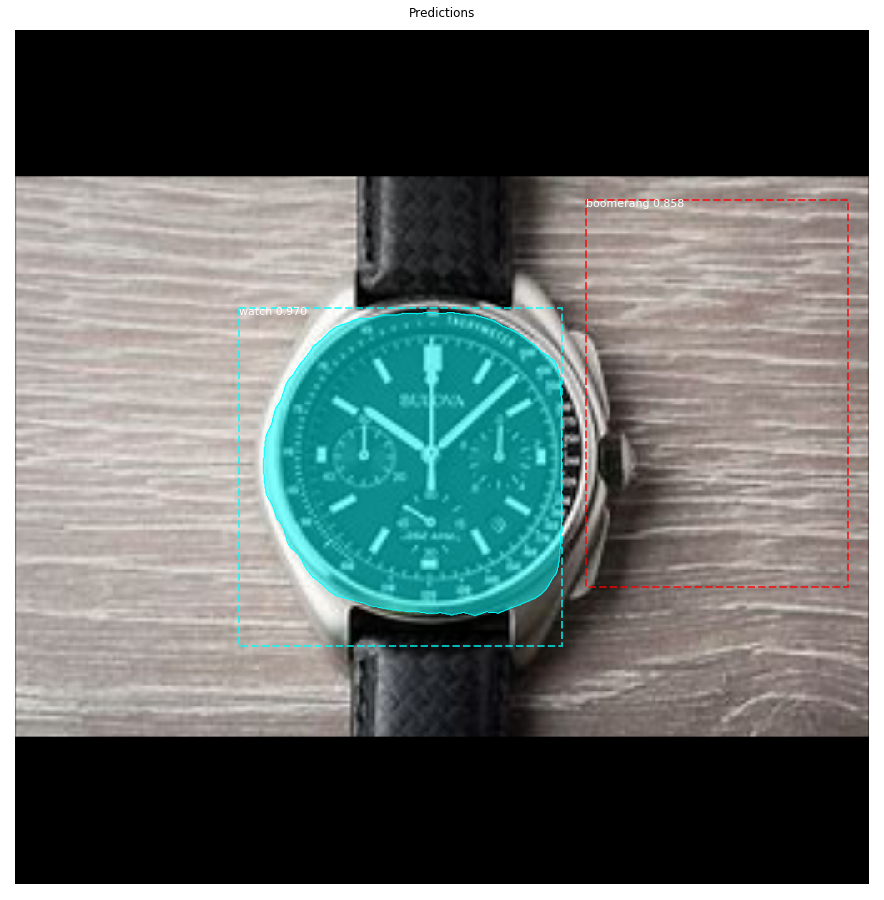

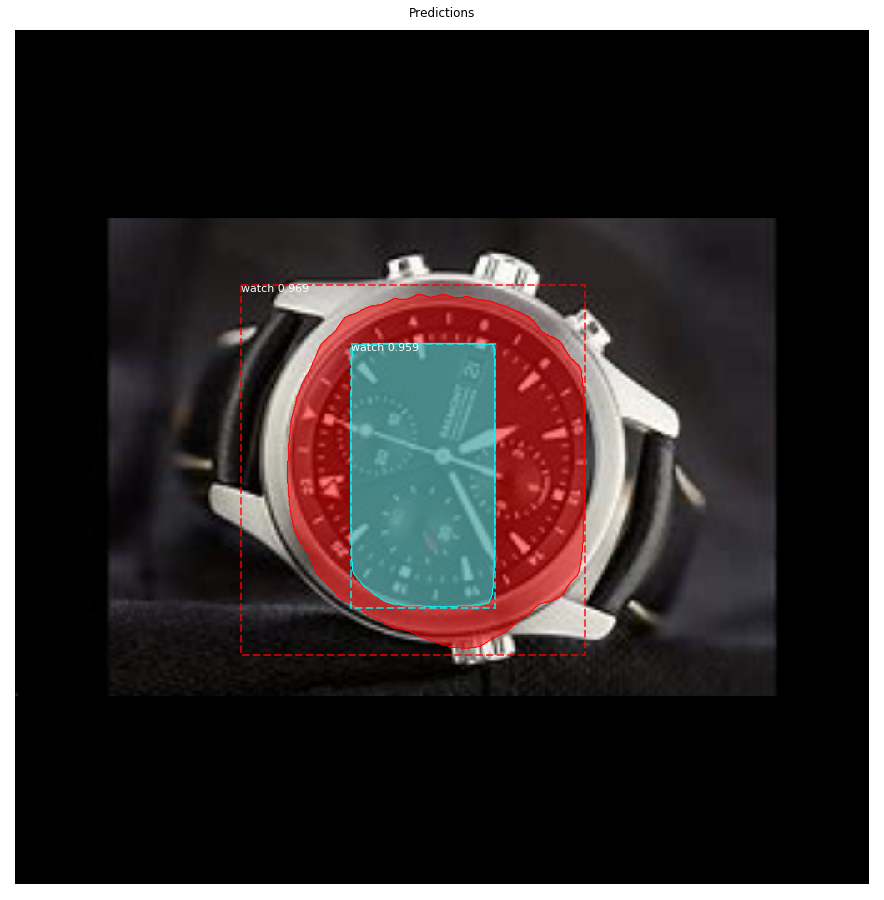

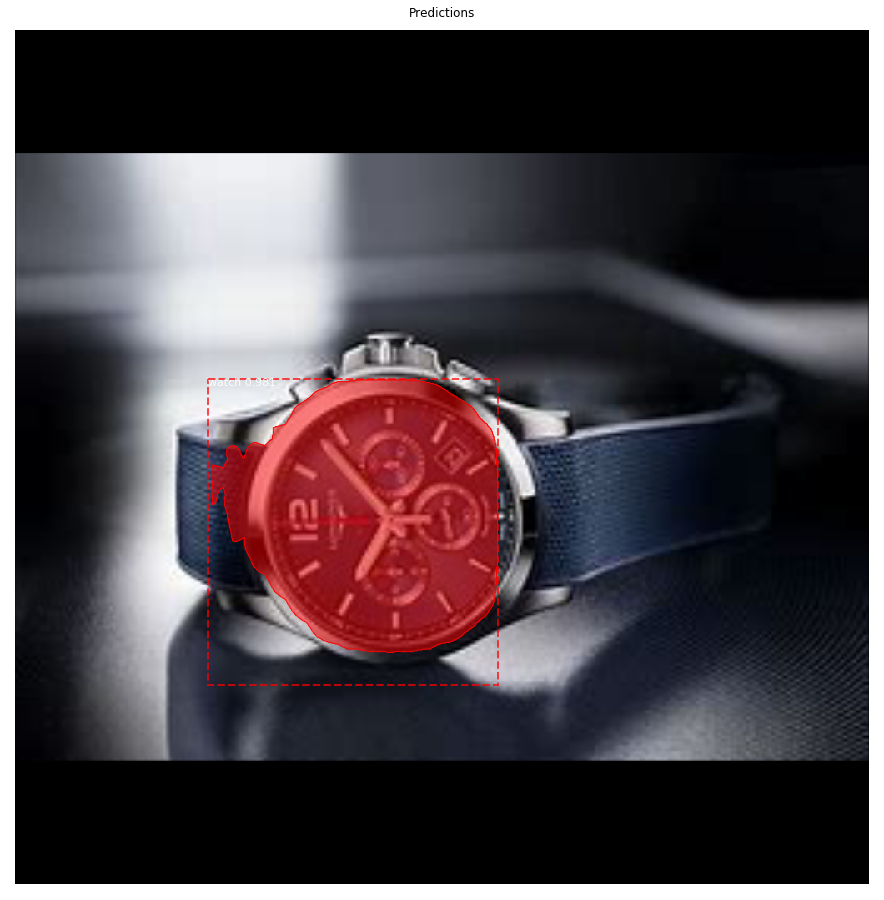

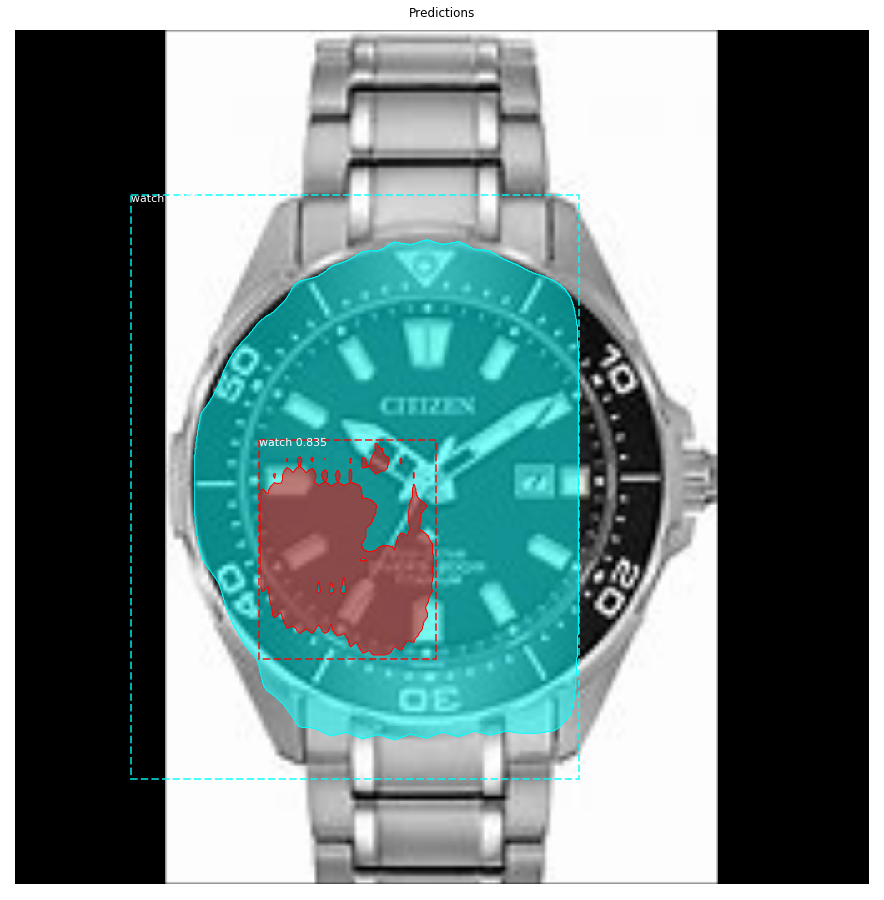

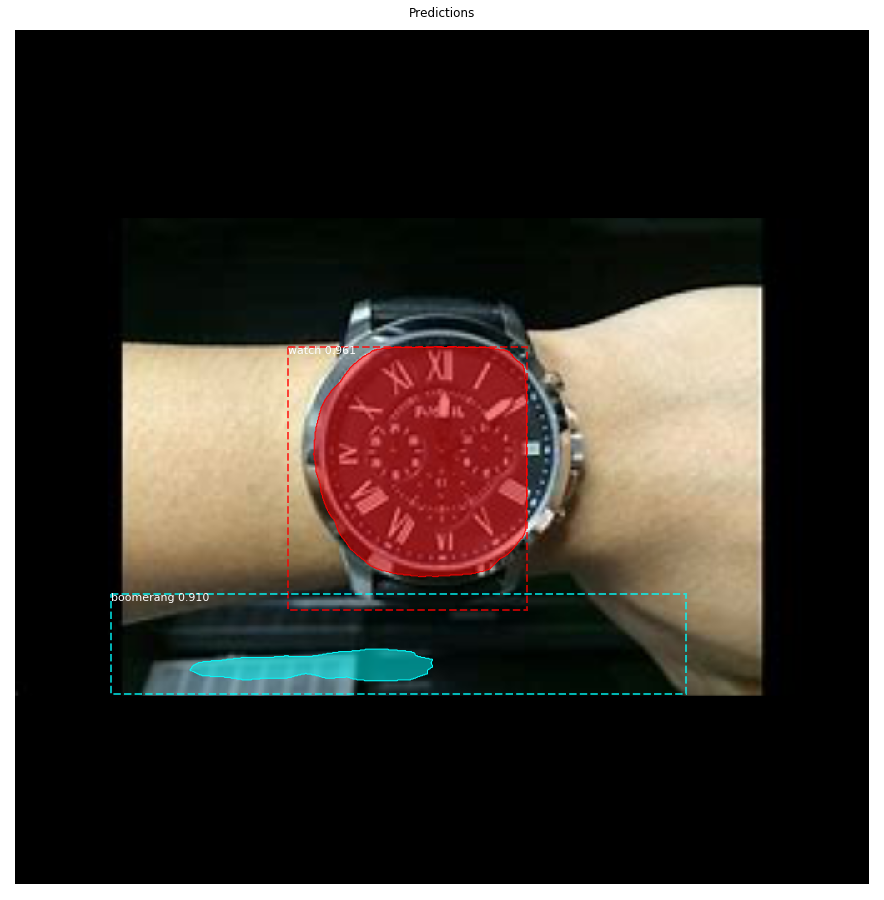

...

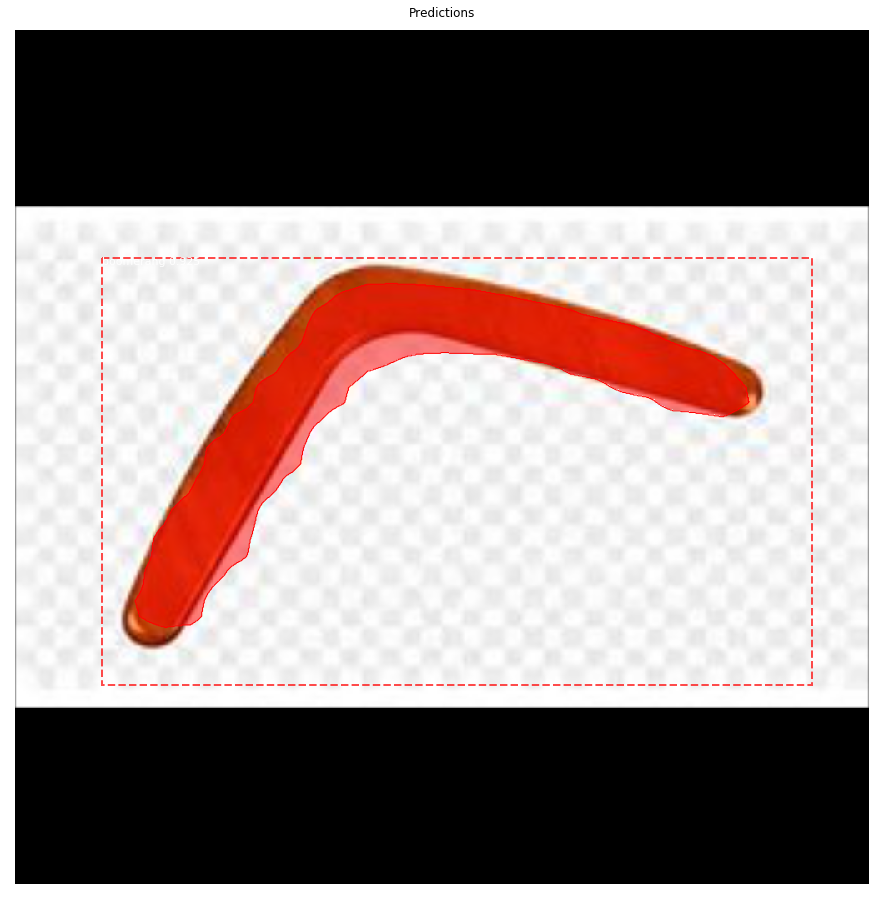

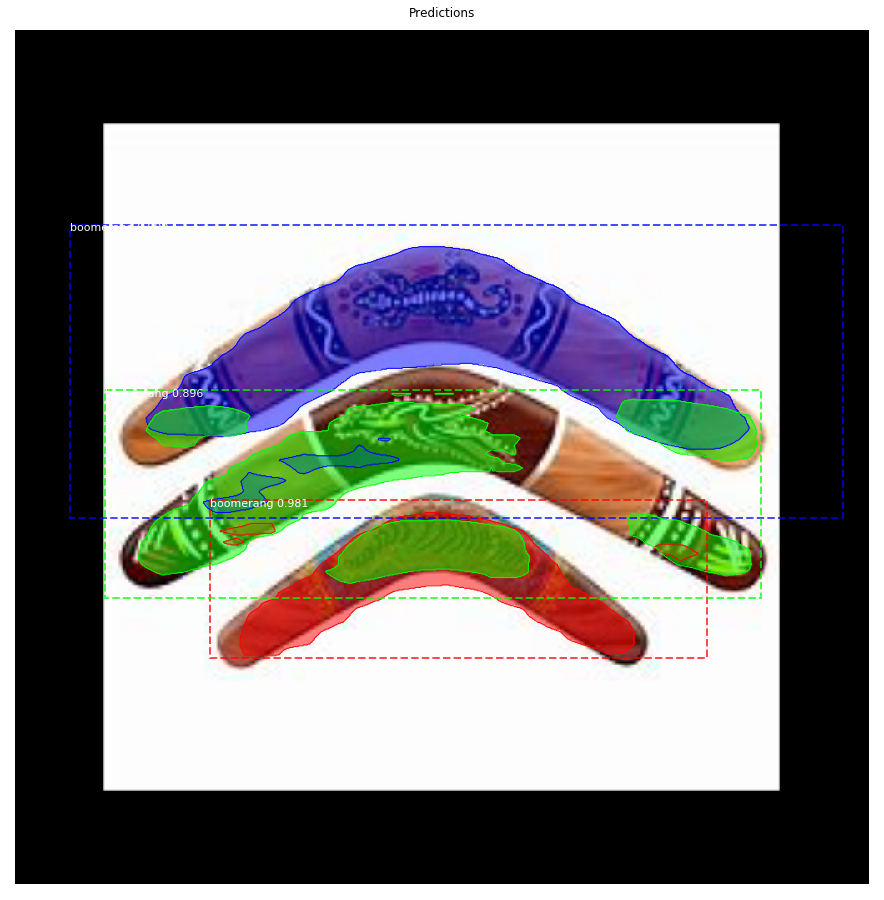

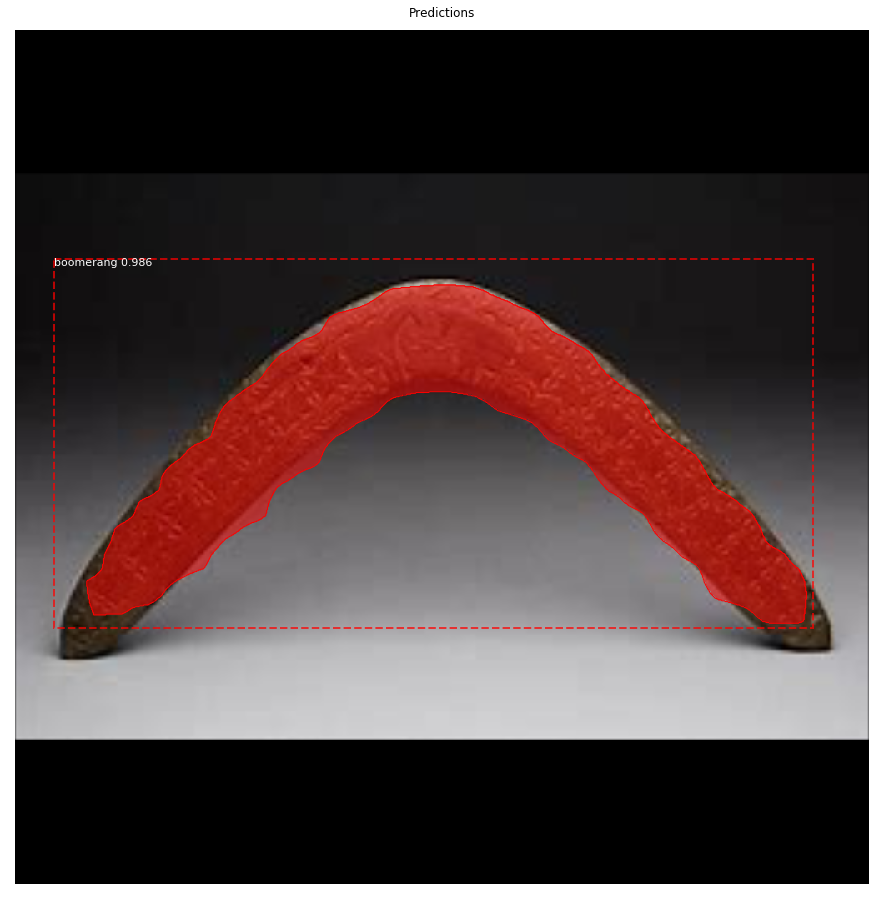

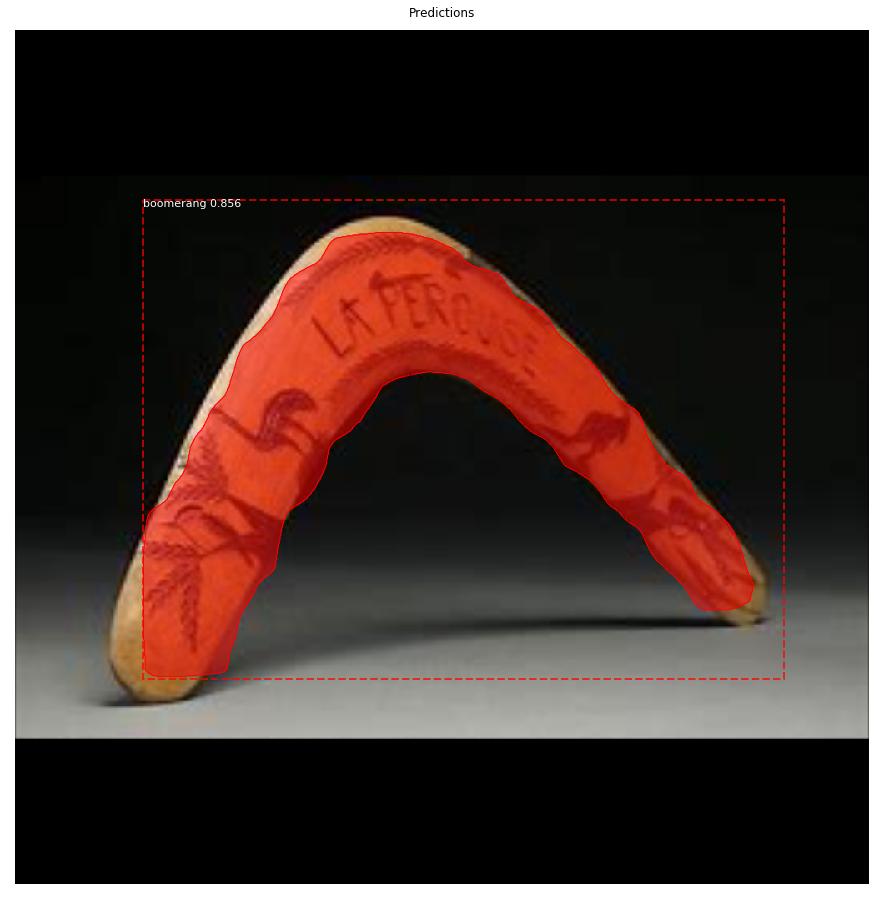

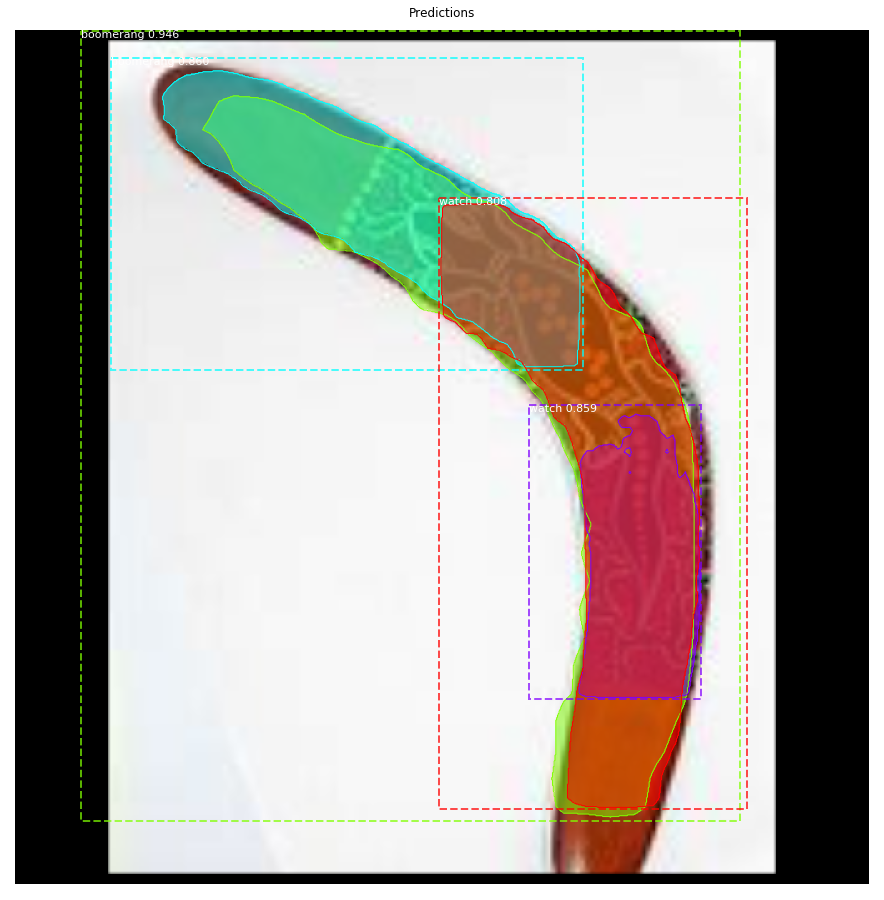

In [15]:
for i in img_list:
        image_id = i
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
        info = dataset.image_info[image_id]
        
        print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
        

        # Run object detection
        results = model.detect([image], verbose=1)

        # Display results
        ax = get_ax(1)
        r = results[0]
        visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
        log("gt_class_id", gt_class_id)
        log("gt_bbox", gt_bbox)
        log("gt_mask", gt_mask)    

In [16]:

# Load validation dataset
dataset = BW_Dataset()

dataset.load_BW("./test/")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))


class loaded******************
annotations  [{'filename': 'c52.jpg', 'size': 11916, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [55, 99, 148, 187, 199, 170, 130, 85, 60], 'all_points_y': [48, 9, 7, 36, 88, 138, 152, 143, 107]}, 'region_attributes': {'class': '1\n'}}], 'file_attributes': {}}, {'filename': 'c53.jpg', 'size': 10842, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [90, 123, 160, 189, 192, 169, 132, 99, 86], 'all_points_y': [65, 33, 35, 63, 104, 135, 139, 120, 99]}, 'region_attributes': {'class': '1\n'}}], 'file_attributes': {}}, {'filename': 'c54.jpg', 'size': 8153, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [88, 113, 148, 184, 193, 174, 135, 90], 'all_points_y': [49, 25, 21, 45, 95, 128, 135, 96]}, 'region_attributes': {'class': '1\n'}}], 'file_attributes': {}}, {'filename': 'c55.jpg', 'size': 6897, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [39, 62, 102, 125, 120, 93, 54, 38



 *********************************this is a {'filename': 'w125.jpg', 'size': 11248, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [57, 104, 142, 176, 214, 204, 145, 133, 86, 72, 54], 'all_points_y': [52, 18, 6, 24, 50, 63, 40, 41, 65, 71, 69]}, 'region_attributes': {'class': '2\n'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [71, 127, 177, 207, 208, 134, 74, 61, 57], 'all_points_y': [83, 53, 68, 91, 105, 79, 117, 118, 105]}, 'region_attributes': {'class': '2\n'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [120, 162, 199, 216, 183, 142, 112, 64, 62], 'all_points_y': [106, 106, 130, 149, 147, 123, 149, 162, 147]}, 'region_attributes': {'class': '2\n'}}], 'file_attributes': {}}


 *********************************this is a {'filename': 'w126.jpg', 'size': 8456, 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [58, 119, 152, 193, 221, 231, 113, 47, 14, 4, 16], 'all_points_y': [71, 32, 49, 89, 124, 152, 70, 135, 151,

image ID: BW.c53.jpg (1) ./test/c53.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
[[357 251 762 603]]
(1024, 1024, 1)
[0.9700143]
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  293.00000  max:  700.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  uint8
image ID: BW.c54.jpg (2) ./test/c54.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max: 

[[ 232    0  748 1024]]
(1024, 1024, 1)
[0.9560212]
gt_class_id              shape: (1,)                  min:    2.00000  max:    2.00000  int32
gt_bbox                  shape: (1, 4)                min:    0.00000  max: 1014.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  uint8
image ID: BW.w110.jpg (25) ./test/w110.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
[[221  94 621 937]]
(1024, 1024, 1)
[0.93808746]
gt_class_id              shape: (1,)                  min:    2.00000  max:    2.00000  int32
gt_bbox                  shape: (1, 4)                min:    2.00000  max: 1008

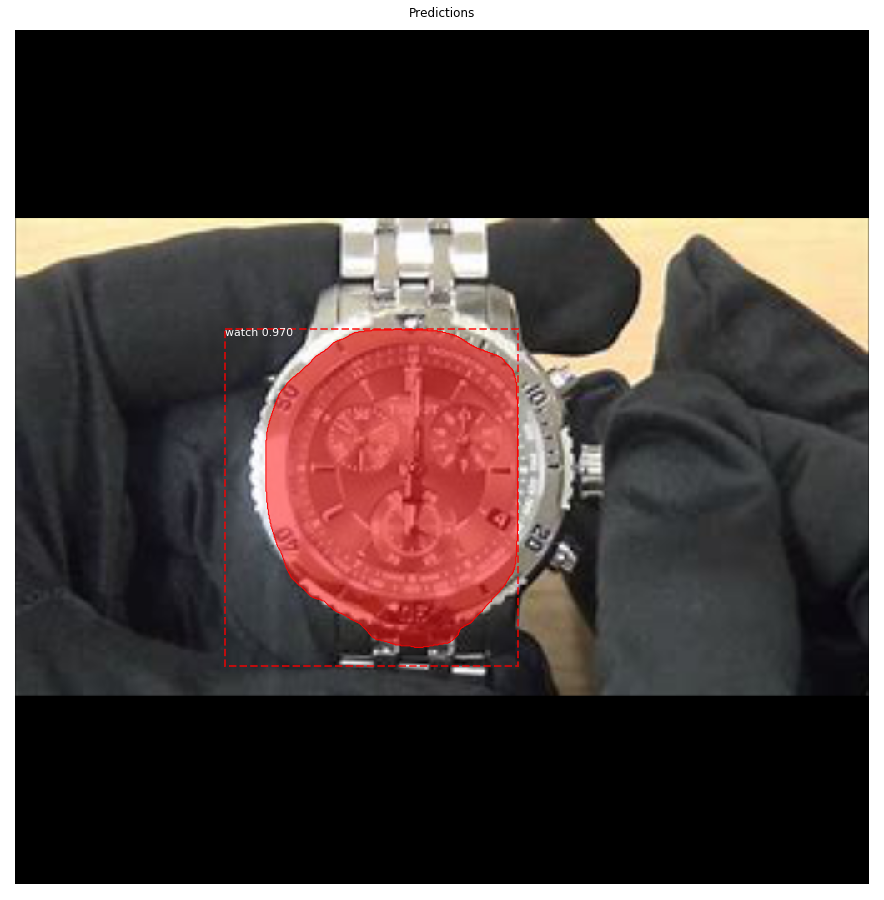

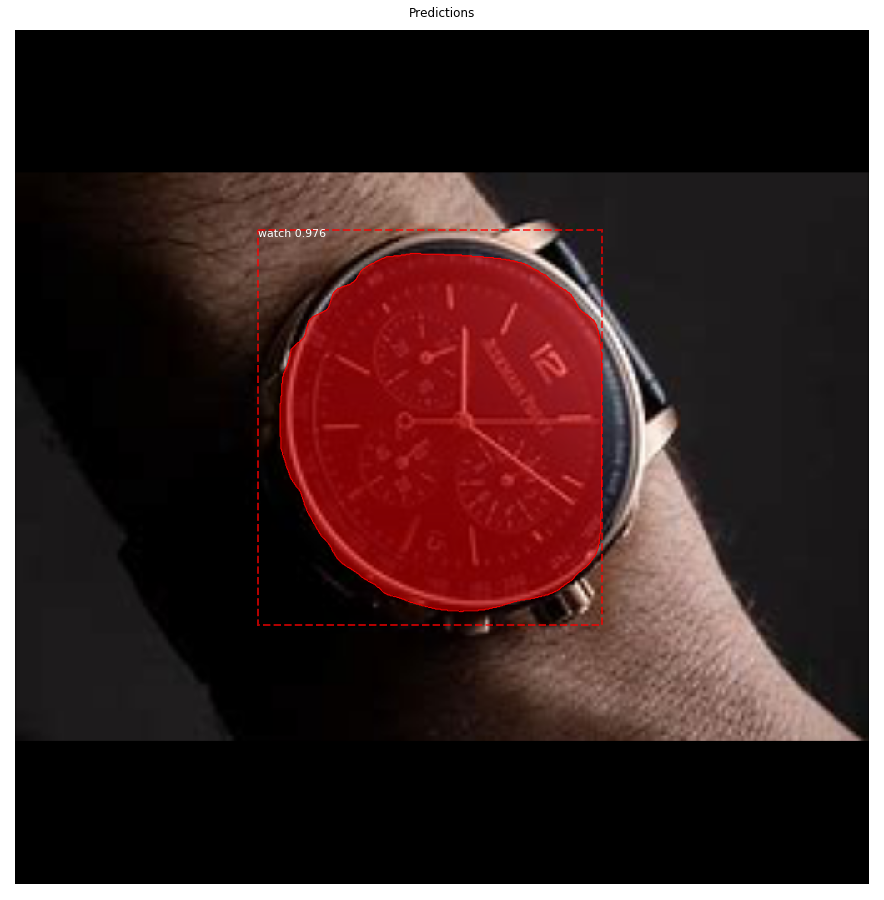

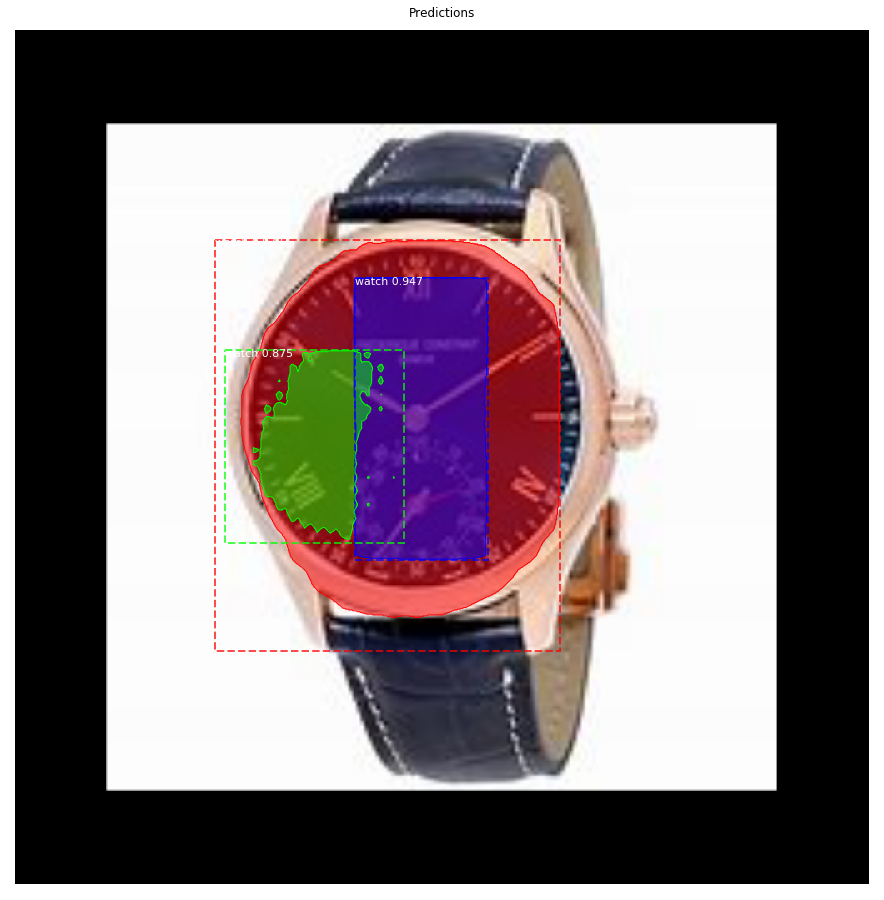

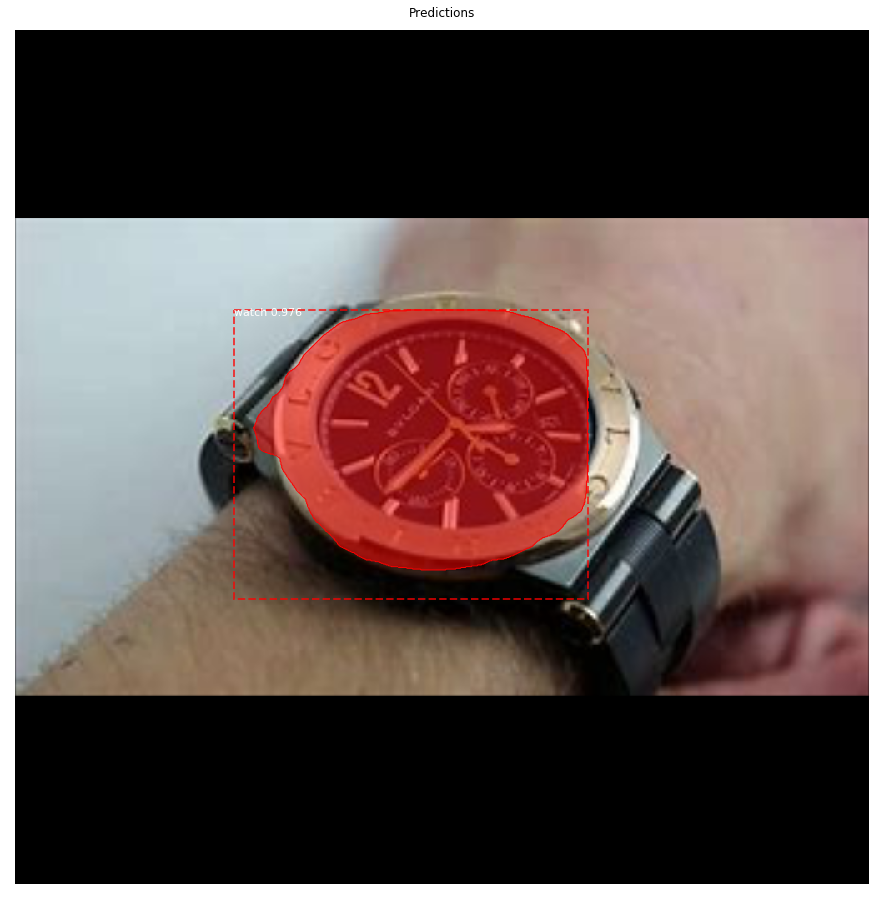

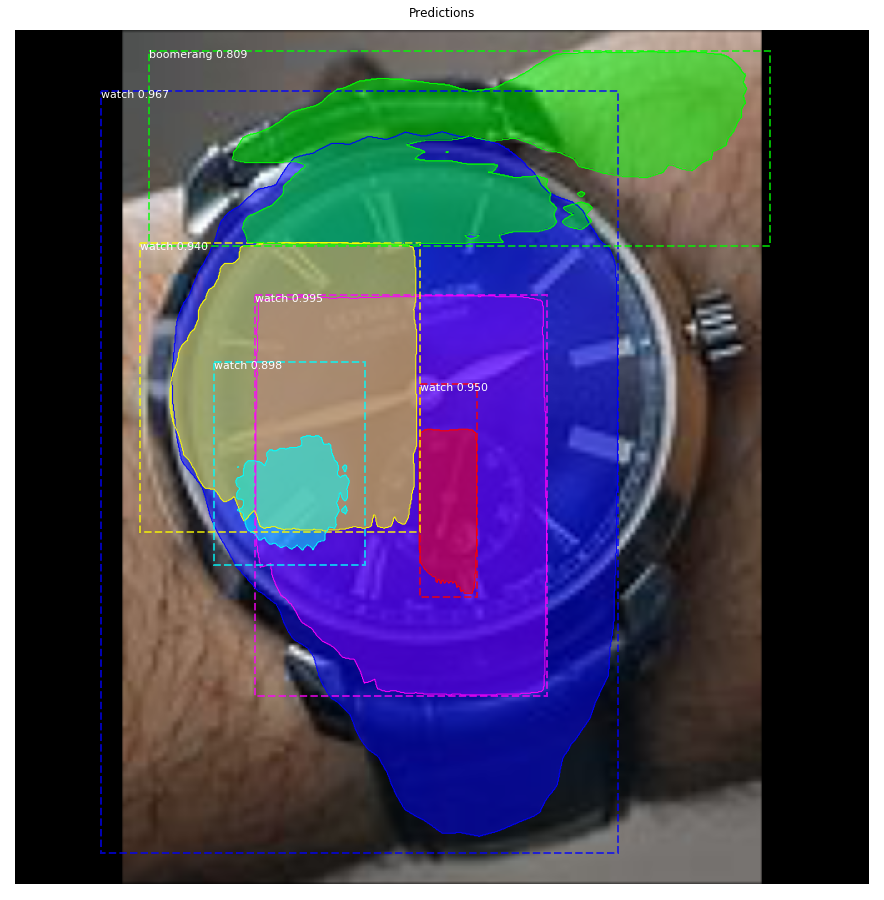

...

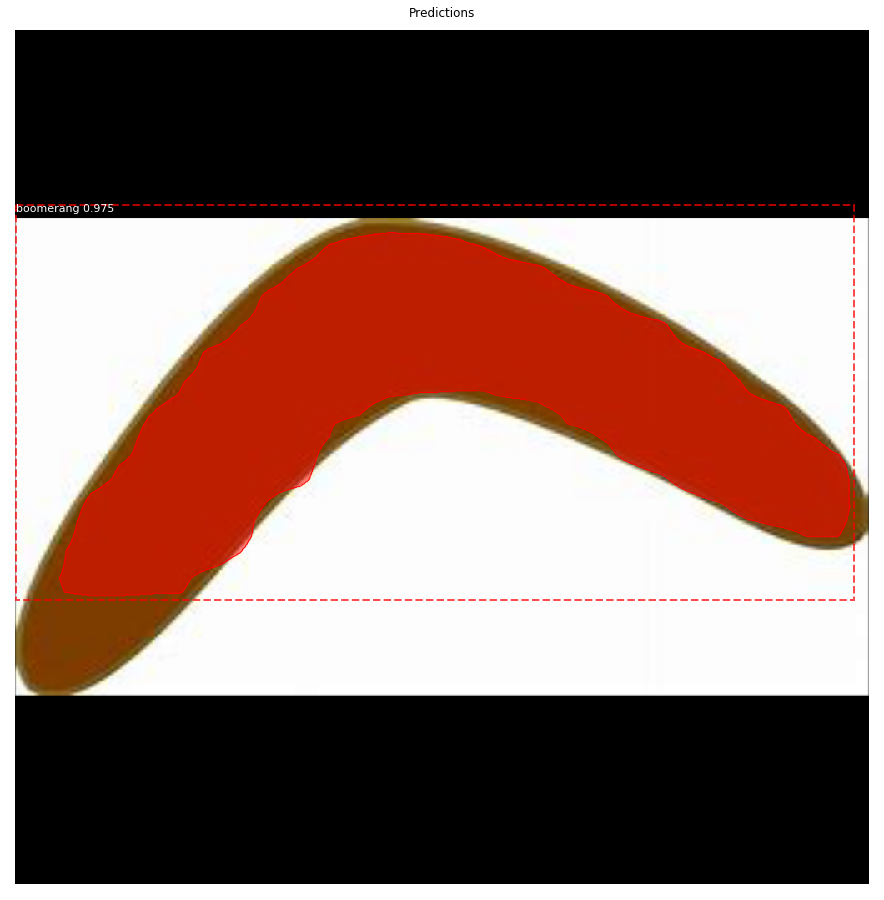

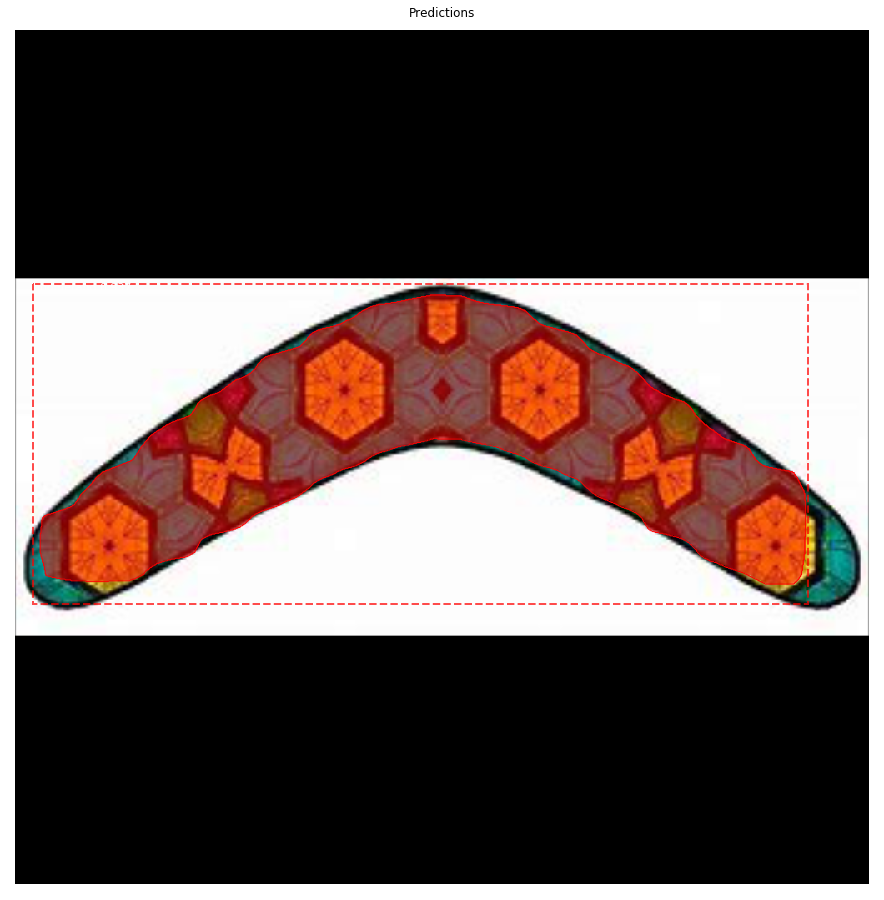

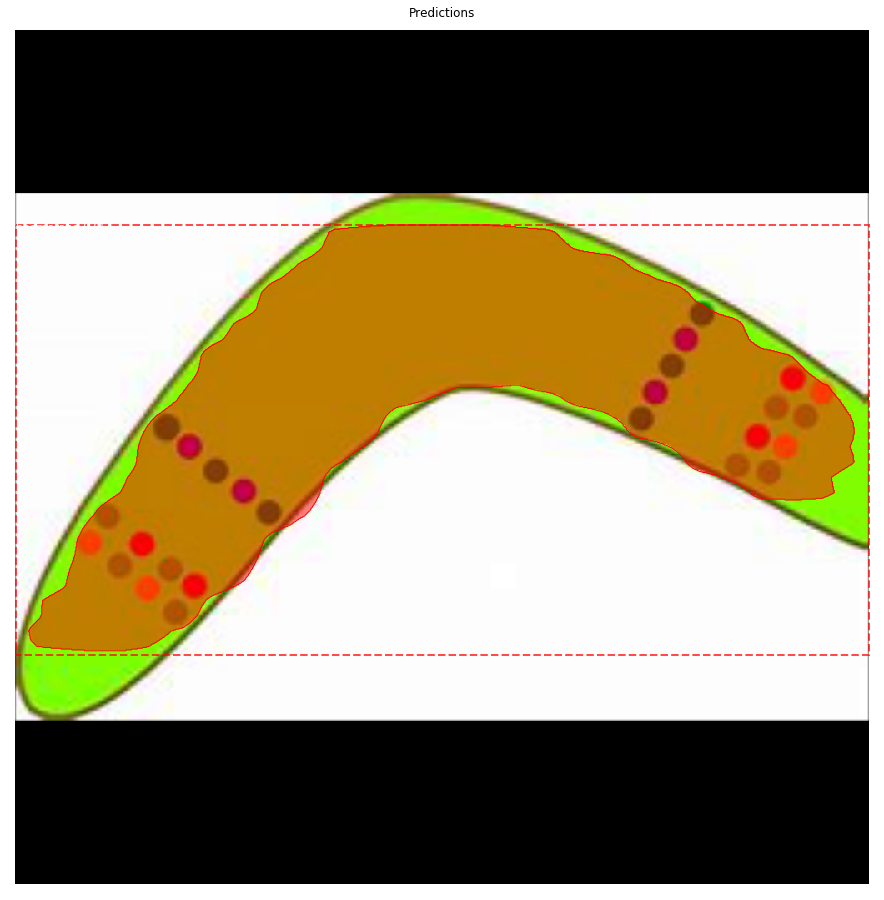

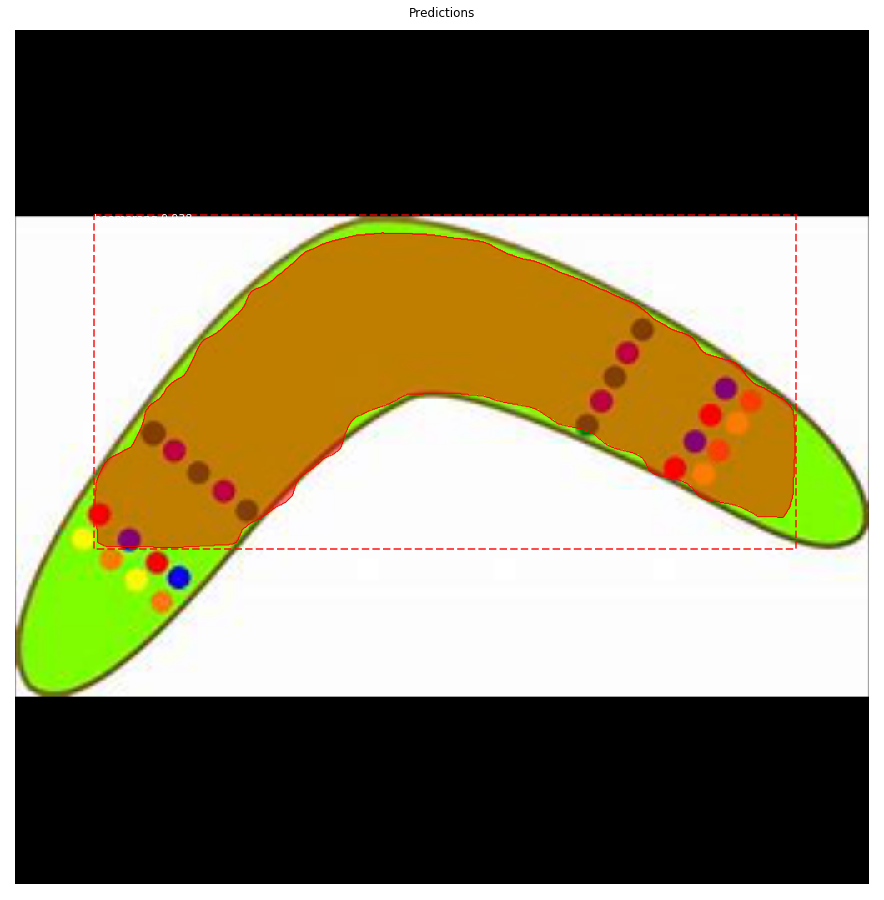

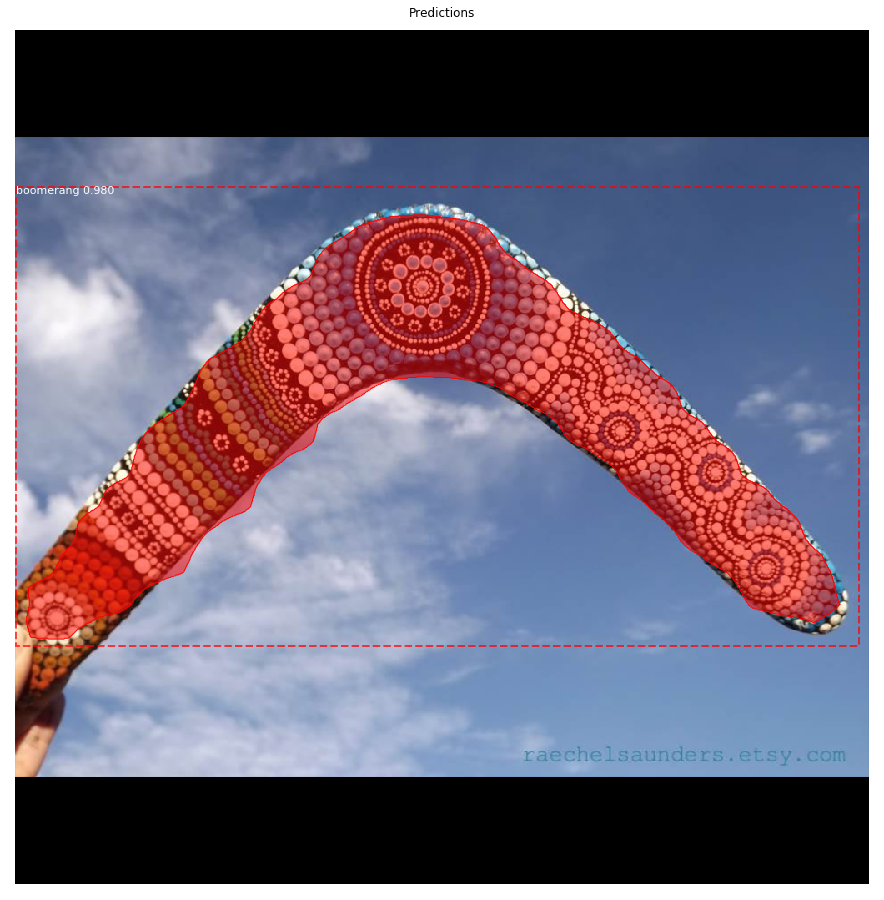

In [17]:
img_list=[1,2,3,5,10,13,14,15,20,21,23,25,30]

for i in img_list:
        image_id = i
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
        info = dataset.image_info[image_id]
        
        print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
        

        # Run object detection
        results = model.detect([image], verbose=1)

        # Display results
        ax = get_ax(1)
        r = results[0]
        
        print(r['rois'])
        print(r['masks'].shape)
        print(r['scores'])
        
        
        visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
        

        log("gt_class_id", gt_class_id)
        log("gt_bbox", gt_bbox)
        log("gt_mask", gt_mask)